In [1]:
import os
import pandas as pd
from PIL import Image
import torch
from torch.utils.data import Dataset, DataLoader
import torchvision.transforms as T
import torchvision
import torchvision.models.detection.faster_rcnn as fasterrcnn
import torch.optim as optim
from torch.utils.data import DataLoader
from tqdm import tqdm

In [2]:
class DroneDataset(Dataset):
    def __init__(self, root_dir, transform=None):
        self.root_dir = root_dir
        self.transform = transform
        self.files = sorted([f for f in os.listdir(root_dir) if f.endswith('.jpg')])

    def __len__(self):
        return len(self.files)

    def __getitem__(self, idx):
        img_name = self.files[idx]
        img_path = os.path.join(self.root_dir, img_name)
        image = Image.open(img_path).convert("RGB")

        # label_path = img_path.replace('.jpg', '.bboxes.labels.tsv')
        bbox_path = img_path.replace('.jpg', '.bboxes.tsv')

        # labels = pd.read_csv(label_path, header=None).values.flatten().tolist()
        bboxes = pd.read_csv(bbox_path, header=None).values

        boxes = []
        for bbox in bboxes:
            bbox_str = str(bbox)  # Convert to string
            bbox_str = bbox_str.strip("[]'")  # Remove surrounding brackets and quotes
            bbox_str = bbox_str.replace("\\t", "\t")  # Replace escaped tab characters
            xmin, ymin, xmax, ymax = map(int, bbox_str.split('\t'))
            boxes.append([xmin, ymin, xmax, ymax])
            
        boxes = torch.as_tensor(boxes, dtype=torch.float32)
        labels = torch.as_tensor([1] * len(boxes), dtype=torch.int64)  # Assuming label '1' for drone

        target = {}
        target["boxes"] = boxes
        target["labels"] = labels

        if self.transform:
            image = self.transform(image)

        return image, target

In [3]:
class DroneTestDataset(Dataset):
    def __init__(self, root_dir, transform=None):
        self.root_dir = root_dir
        self.transform = transform
        self.files = sorted([f for f in os.listdir(root_dir) if f.endswith('.jpg')])

    def __len__(self):
        return len(self.files)

    def __getitem__(self, idx):
        img_name = self.files[idx]
        img_path = os.path.join(self.root_dir, img_name)
        image = Image.open(img_path).convert("RGB")
        if self.transform:
            image = self.transform(image)

        return image

In [4]:
transform = T.Compose([
    T.ToTensor(),
])

In [5]:
train_dataset = DroneDataset(root_dir='/kaggle/input/drone-detection/drones_dataset/train', transform=transform)
val_dataset = DroneDataset(root_dir='/kaggle/input/drone-detection/drones_dataset/validation', transform=transform)

In [6]:
test_dataset = DroneTestDataset(root_dir='/kaggle/input/drone-detection/test', transform=transform)

In [7]:
train_loader = DataLoader(train_dataset, batch_size=4, shuffle=True, collate_fn=lambda x: tuple(zip(*x)))
val_loader = DataLoader(val_dataset, batch_size=4, shuffle=False, collate_fn=lambda x: tuple(zip(*x)))

In [8]:
test_loader = DataLoader(test_dataset, batch_size=1, shuffle=False)

In [9]:
model = fasterrcnn.fasterrcnn_resnet50_fpn(pretrained=True)
num_classes = 2  # 1 class (drone) + background

/opt/conda/lib/python3.10/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=FasterRCNN_ResNet50_FPN_Weights.COCO_V1`. You can also use `weights=FasterRCNN_ResNet50_FPN_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/fasterrcnn_resnet50_fpn_coco-258fb6c6.pth" to /root/.cache/torch/hub/checkpoints/fasterrcnn_resnet50_fpn_coco-258fb6c6.pth
100%|██████████| 160M/160M [00:00<00:00, 183MB/s] 


In [10]:
# Get the number of input features for the classifier
in_features = model.roi_heads.box_predictor.cls_score.in_features

In [11]:
# Replace the head of the model
model.roi_heads.box_predictor = torchvision.models.detection.faster_rcnn.FastRCNNPredictor(in_features, num_classes)

In [12]:
device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')
model.to(device)

FasterRCNN(
  (transform): GeneralizedRCNNTransform(
      Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
      Resize(min_size=(800,), max_size=1333, mode='bilinear')
  )
  (backbone): BackboneWithFPN(
    (body): IntermediateLayerGetter(
      (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): FrozenBatchNorm2d(64, eps=0.0)
      (relu): ReLU(inplace=True)
      (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (layer1): Sequential(
        (0): Bottleneck(
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): FrozenBatchNorm2d(64, eps=0.0)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): FrozenBatchNorm2d(64, eps=0.0)
          (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn3): FrozenBatchNorm2d(256, eps=0.0)
          (relu): ReLU(

In [13]:
# Define optimizer
params = [p for p in model.parameters() if p.requires_grad]
optimizer = optim.SGD(params, lr=0.005, momentum=0.9, weight_decay=0.0005)

In [14]:
# Training function
def train_one_epoch(model, optimizer, data_loader, device, epoch):
    model.train()
    train_pbar = tqdm(data_loader, desc=f"Epoch {epoch+1}/{num_epochs} (training)", leave=False)
    running_loss = 0.0
        
    for batch_idx, (images, targets) in enumerate(data_loader, 1):
        images = list(image.to(device) for image in images)
        targets = [{k: v.to(device) for k, v in t.items()} for t in targets]
        
        loss_dict = model(images, targets)
        
        losses = sum(loss for loss in loss_dict.values())
        running_loss += losses.item()
        
        optimizer.zero_grad()
        losses.backward()
        optimizer.step()
        train_pbar.set_postfix({"loss": running_loss / (batch_idx+1)})

In [15]:
# Validation function
def evaluate(model, data_loader, device, epoch):
    model.train()
    train_pbar = tqdm(data_loader, desc=f"Epoch {epoch+1}/{num_epochs} (validating)", leave=False)
    running_loss = 0.0
    
    with torch.no_grad():
        for batch_idx, (images, targets) in enumerate(data_loader, 1):
            images = list(image.to(device) for image in images)
            targets = [{k: v.to(device) for k, v in t.items()} for t in targets]
            
            loss_dict = model(images, targets)

            losses = sum(loss for loss in loss_dict.values())
            running_loss += losses.item()

            train_pbar.set_postfix({"loss": running_loss / (batch_idx+1)})
            
    avg_loss = running_loss / len(data_loader)
    return avg_loss

In [16]:
# Training and validation loop
num_epochs = 10
for epoch in range(num_epochs):
    train_one_epoch(model, optimizer, train_loader, device, epoch)
    val_loss = evaluate(model, val_loader, device, epoch)
    print(f"Epoch {epoch}: Validation Loss: {val_loss}")

Epoch 0: Validation Loss: 0.08217368566909351


Epoch 1: Validation Loss: 0.07147985908227998


Epoch 2: Validation Loss: 0.06683440551765867


Epoch 3: Validation Loss: 0.06495067487294609


Epoch 4: Validation Loss: 0.07278386936397166


Epoch 5: Validation Loss: 0.06440286509491303


Epoch 6: Validation Loss: 0.06249842259126741


Epoch 7: Validation Loss: 0.06503729371202958


Epoch 8: Validation Loss: 0.06383717513164959


Epoch 9: Validation Loss: 0.062290631385671126


In [17]:
pred_images = []

In [18]:
# Function to test the model
def test(model, data_loader, device):
    model.eval()
    all_predictions = []
    with torch.no_grad():
        for image in data_loader:
            for img in image:
                pred_images.append(img)
            image = image.to(device) 
            predictions = model(image)
            all_predictions.extend(predictions)
            
    return all_predictions, pred_images

In [19]:
# Test the model
test_predictions, pred_images = test(model, test_loader, device)

In [20]:
def draw_bboxes(image, bboxes, labels, scores, label_map, threshold = 0.75):
    """
    Draw bounding boxes, labels, and scores on an image.

    Args:
    - image (numpy array): The image on which to draw.
    - bboxes (list of tuples): Each tuple contains (x_min, y_min, x_max, y_max).
    - labels (list of int): The class labels corresponding to the bboxes.
    - scores (list of float): The scores corresponding to the bboxes.
    - label_map (dict): A mapping from label indices to label names.
    - score_threshold (float): Minimum score to display bbox.
    """
    for bbox, label, score in zip(bboxes, labels, scores):
        if score <= threshold:
            continue
        x_min, y_min, x_max, y_max = bbox # Unpack the bbox tuple
            # Draw rectangle
        cv2.rectangle(image, (int(x_min), int(y_min)), (int(x_max), int(y_max)), color=(0, 255, 0), thickness=2)
            # Prepare label and score text
        label_text = f"{label_map[int(label)]}: {score:.2f}"
            # Put text on image
        cv2.putText(image, label_text, (int(x_min), int(y_min) - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)
    return image

In [21]:
label_map = {1: 'Drone'}

In [22]:
import numpy as np

In [23]:
import matplotlib.pyplot as plt

In [24]:
import cv2

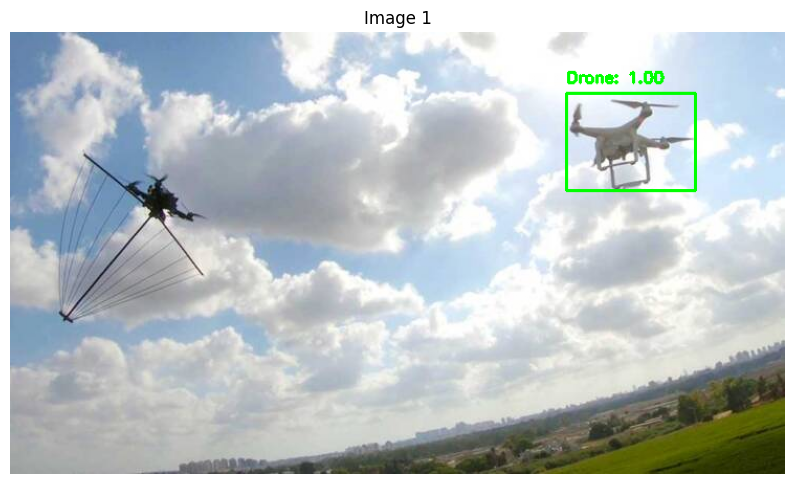

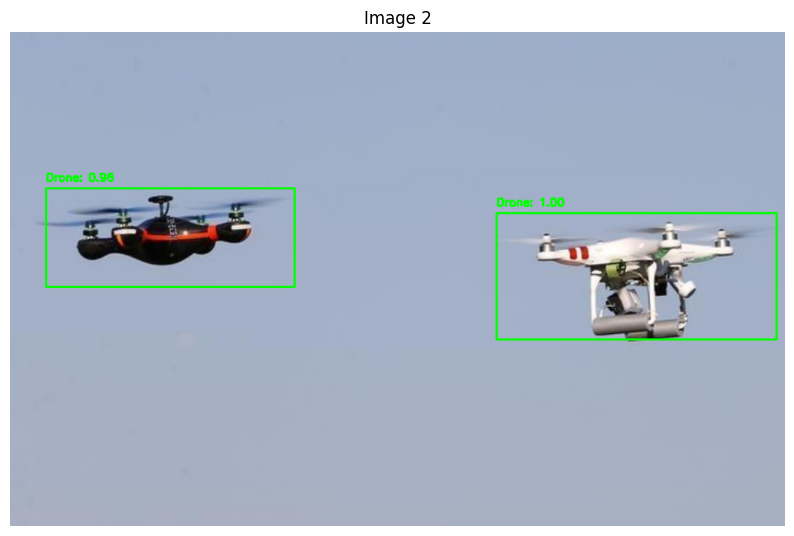

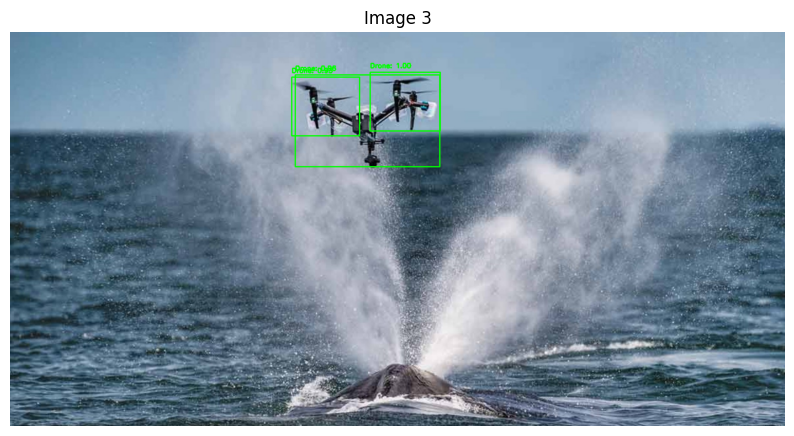

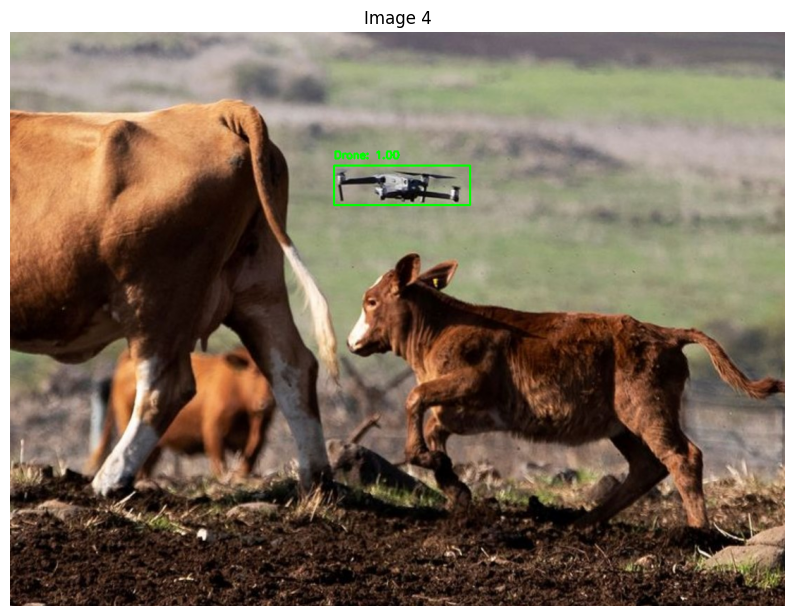

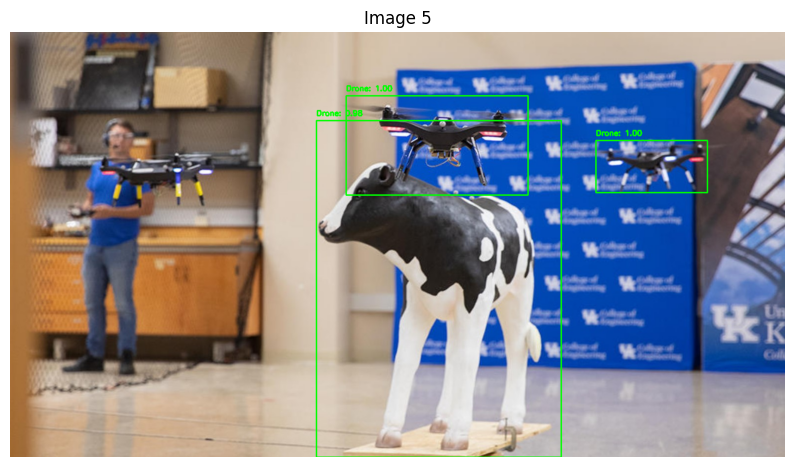

...

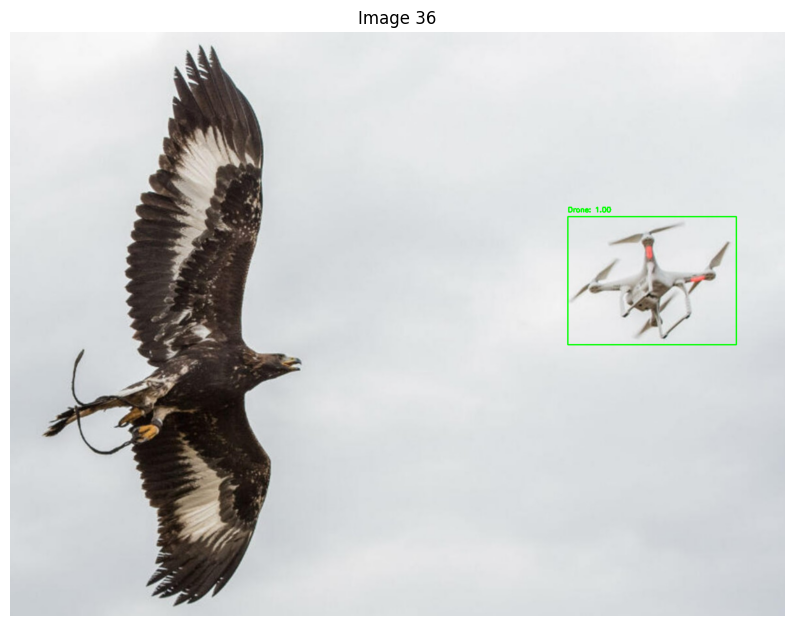

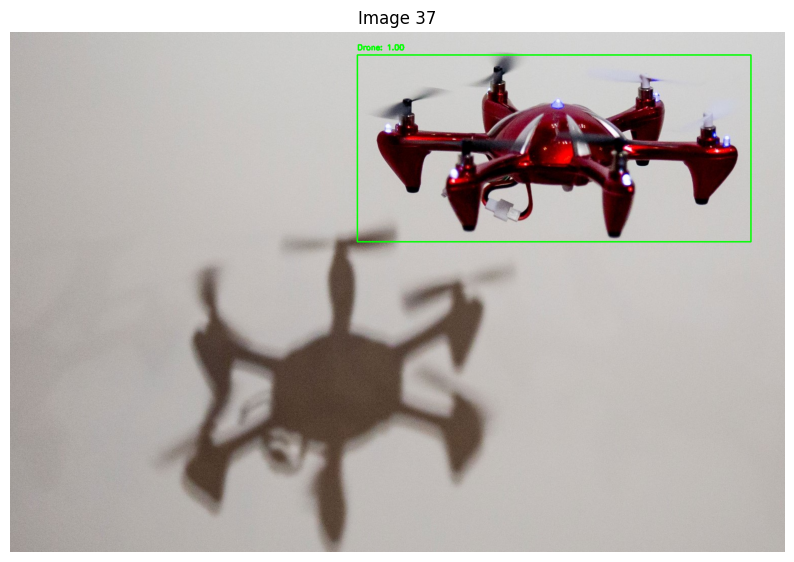

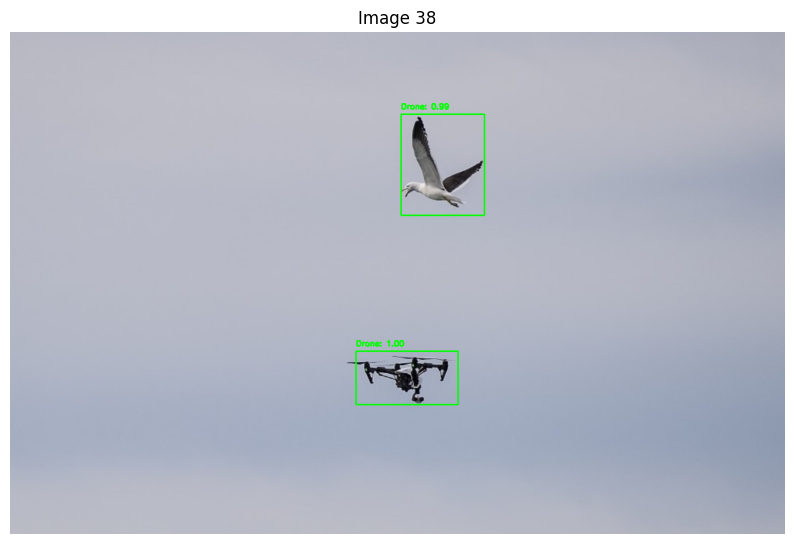

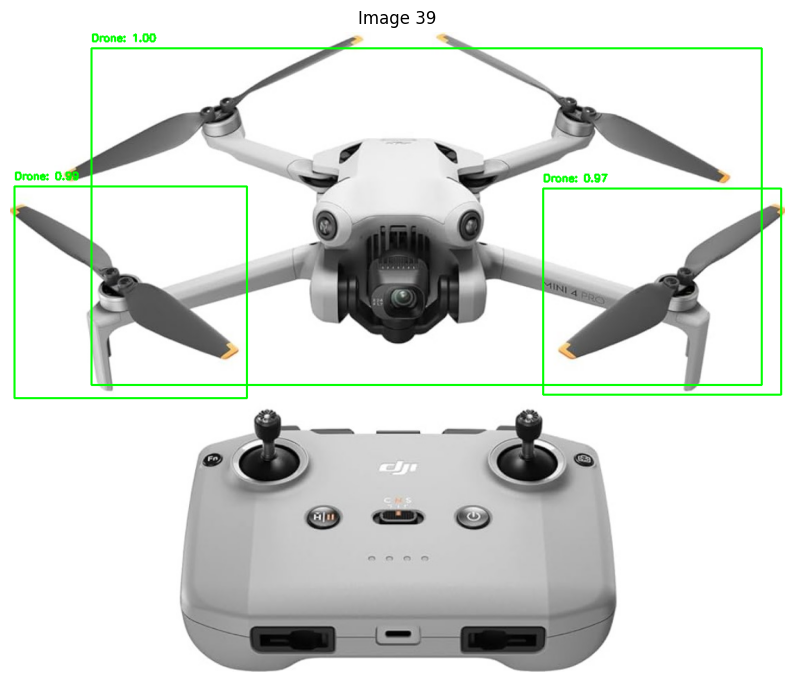

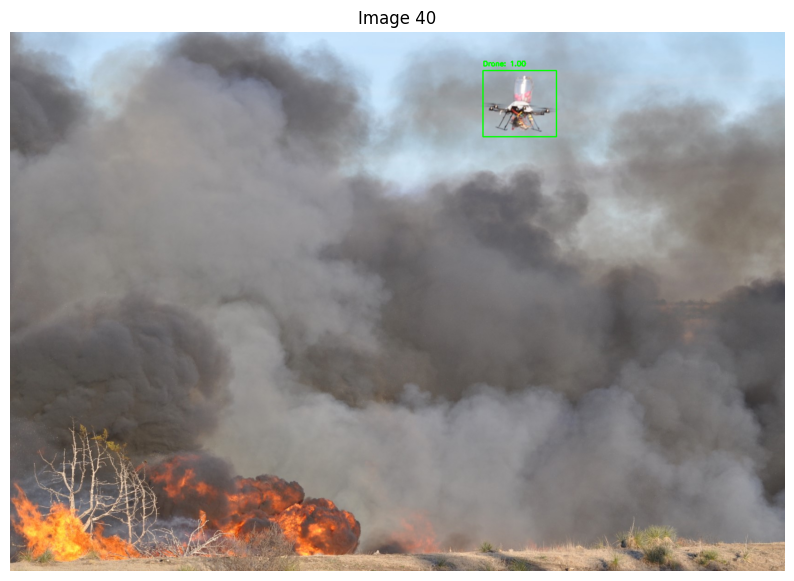

In [25]:
for i, prediction in enumerate(test_predictions):
    bboxes = prediction['boxes'].cpu().numpy()
    labels = prediction['labels'].cpu().numpy()
    scores = prediction['scores'].cpu().numpy()
    image = pred_images[i]
    image = image.cpu().numpy().transpose(1, 2, 0)
    image = cv2.cvtColor(image, cv2.COLOR_RGB2BGR) 
    
    # Draw bboxes on the image
    image_with_bboxes = draw_bboxes(image, bboxes, labels, scores, label_map)
    
    # Plot the image
    plt.figure(figsize=(10, 10))
    plt.imshow(cv2.cvtColor(image_with_bboxes, cv2.COLOR_BGR2RGB))
    plt.title(f"Image {i+1}")
    plt.axis('off')
    plt.show()
